# Heavy Traffic Indicators on I-94

***
This project is mainly for practicing data visualization.
***

This project is to analyze a data set of hourly westbound traffic on the I-94 interstate highway, at station 301, in the US. The objective of this project is to determine indicators of heavy traffic on I-94 highway. The indicators include, but not limited to, weather type, time of the day, and time of the week.

The data set is made available by John Hogue and could be downloaded at <a href="https://archive.ics.uci.edu/ml/datasets/Metro+Interstate+Traffic+Volume">UCI Machine Learning Repository</a> website.

Data Dictionary:

| Column name | Description |
|-------------|-------------|
| holiday | US National holidays and regional holidays |
| temp | Average temperature in Kelvin (K) |
| rain_1h | Amount of rain in millimetre (mm) in the hour |
| snow_1h | Amount of snow in millimetre (mm) in the hour |
| cloud | Percentage of cloud covered |
| weather_main | Short description of the weather |
| weather_description | Long description of the weather |
| date_time | Date and time of data collected in Central Standard Time (UTC -6)
| traffic_volume | Hourly reported traffic volume (unit: cars) |

## Explore data

In [1]:
import numpy as np
import pandas as pd

traffic = pd.read_csv("D:\Documents\Python Journey\Dataquest\Guided Project 4_Heavy Traffic Indicators On I-94\Metro_Interstate_Traffic_Volume.csv")

print(traffic.head(5))
print()
print(traffic.tail(5))

  holiday    temp  rain_1h  snow_1h  clouds_all weather_main  \
0    None  288.28      0.0      0.0          40       Clouds   
1    None  289.36      0.0      0.0          75       Clouds   
2    None  289.58      0.0      0.0          90       Clouds   
3    None  290.13      0.0      0.0          90       Clouds   
4    None  291.14      0.0      0.0          75       Clouds   

  weather_description            date_time  traffic_volume  
0    scattered clouds  2012-10-02 09:00:00            5545  
1       broken clouds  2012-10-02 10:00:00            4516  
2     overcast clouds  2012-10-02 11:00:00            4767  
3     overcast clouds  2012-10-02 12:00:00            5026  
4       broken clouds  2012-10-02 13:00:00            4918  

      holiday    temp  rain_1h  snow_1h  clouds_all  weather_main  \
48199    None  283.45      0.0      0.0          75        Clouds   
48200    None  282.76      0.0      0.0          90        Clouds   
48201    None  282.73      0.0      0.0  

In [2]:
traffic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48204 entries, 0 to 48203
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   holiday              48204 non-null  object 
 1   temp                 48204 non-null  float64
 2   rain_1h              48204 non-null  float64
 3   snow_1h              48204 non-null  float64
 4   clouds_all           48204 non-null  int64  
 5   weather_main         48204 non-null  object 
 6   weather_description  48204 non-null  object 
 7   date_time            48204 non-null  object 
 8   traffic_volume       48204 non-null  int64  
dtypes: float64(3), int64(2), object(4)
memory usage: 3.3+ MB


In [3]:
traffic.describe(include="all")

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
count,48204,48204.000000,48204.000000,48204.000000,48204.000000,48204,48204,48204,48204.000000
unique,12,NaN,NaN,NaN,NaN,11,38,40575,NaN
top,None,NaN,NaN,NaN,NaN,Clouds,sky is clear,2013-04-18 22:00:00,NaN
freq,48143,NaN,NaN,NaN,NaN,15164,11665,6,NaN
mean,NaN,281.205870,0.334264,0.000222,49.362231,NaN,NaN,NaN,3259.818355
std,NaN,13.338232,44.789133,0.008168,39.015750,NaN,NaN,NaN,1986.860670
min,NaN,0.000000,0.000000,0.000000,0.000000,NaN,NaN,NaN,0.000000
25%,NaN,272.160000,0.000000,0.000000,1.000000,NaN,NaN,NaN,1193.000000
50%,NaN,282.450000,0.000000,0.000000,64.000000,NaN,NaN,NaN,3380.000000
75%,NaN,291.806000,0.000000,0.000000,90.000000,NaN,NaN,NaN,4933.000000


In [4]:
print(traffic[traffic["temp"] == 0])

      holiday  temp  rain_1h  snow_1h  clouds_all weather_main  \
11898    None   0.0      0.0      0.0           0        Clear   
11899    None   0.0      0.0      0.0           0        Clear   
11900    None   0.0      0.0      0.0           0        Clear   
11901    None   0.0      0.0      0.0           0        Clear   
11946    None   0.0      0.0      0.0           0        Clear   
11947    None   0.0      0.0      0.0           0        Clear   
11948    None   0.0      0.0      0.0           0        Clear   
11949    None   0.0      0.0      0.0           0        Clear   
11950    None   0.0      0.0      0.0           0        Clear   
11951    None   0.0      0.0      0.0           0        Clear   

      weather_description            date_time  traffic_volume  
11898        sky is clear  2014-01-31 03:00:00             361  
11899        sky is clear  2014-01-31 04:00:00             734  
11900        sky is clear  2014-01-31 05:00:00            2557  
11901        

There are 48,204 rows and 9 columns in this data set. There are no columns with null values. The data types seem to match the description of each column. `date_time` column is currently formatted as string. We will convert it to datetime format to allow us to do some analysis. 

Additionally, we notice the 0 in the `temp` column. This column has a unit of Kelvin (K). 0K would equal to -273 degree celcius, which is impossible for a weather condition. However, we will keep these rows for now as the traffic volume data seem valid.

## Analyze traffic volume
### Overall traffic

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline

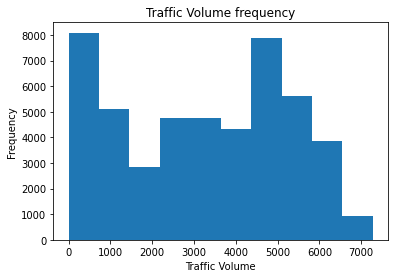

count    48204.000000
mean      3259.818355
std       1986.860670
min          0.000000
25%       1193.000000
50%       3380.000000
75%       4933.000000
max       7280.000000
Name: traffic_volume, dtype: float64


In [6]:
traffic["traffic_volume"].plot.hist()
plt.title("Traffic Volume frequency")
plt.xlabel("Traffic Volume")
plt.show()

print(traffic["traffic_volume"].describe())

The frequency for very low volume (0-1,000) is about the same frequency as at high volume (~5,000). This might indicate the traffic between daytime and nighttime. Next we will convert `date_time` column into datetime format to further analyse the traffic between daytime and nighttime. 

### Traffic Volume during daytime and nighttime

In [7]:
# Convert date and time in string format to datetime format

traffic["date_time"] = pd.to_datetime(traffic["date_time"])
traffic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48204 entries, 0 to 48203
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   holiday              48204 non-null  object        
 1   temp                 48204 non-null  float64       
 2   rain_1h              48204 non-null  float64       
 3   snow_1h              48204 non-null  float64       
 4   clouds_all           48204 non-null  int64         
 5   weather_main         48204 non-null  object        
 6   weather_description  48204 non-null  object        
 7   date_time            48204 non-null  datetime64[ns]
 8   traffic_volume       48204 non-null  int64         
dtypes: datetime64[ns](1), float64(3), int64(2), object(3)
memory usage: 3.3+ MB


In [8]:
# Add "hour" column

traffic["hour"] = traffic["date_time"].dt.hour
traffic["hour"].value_counts().sort_index()

0     2037
1     2049
2     2019
3     2025
4     2091
5     2063
6     2087
7     2079
8     2080
9     2018
10    2078
11    1952
12    1955
13    1905
14    1969
15    1934
16    1988
17    1933
18    1986
19    1961
20    1979
21    1982
22    1994
23    2040
Name: hour, dtype: int64

The counts above confirms that the data set uses 24-hour format. We will separate the data into 2 groups: `day` (7am - 7pm) and `night` (7pm - 7am).

In [9]:
# Identify day and night

traffic["day_night"] = (traffic["hour"] >= 7) & (traffic["hour"] < 19)
traffic.loc[traffic["day_night"] == True, "day_night"] = "day"
traffic.loc[traffic["day_night"] == False, "day_night"] = "night"

# Separate into 2 dataframes

tr_day = traffic.loc[traffic["day_night"] == "day"]
tr_night = traffic.loc[traffic["day_night"] == "night"]

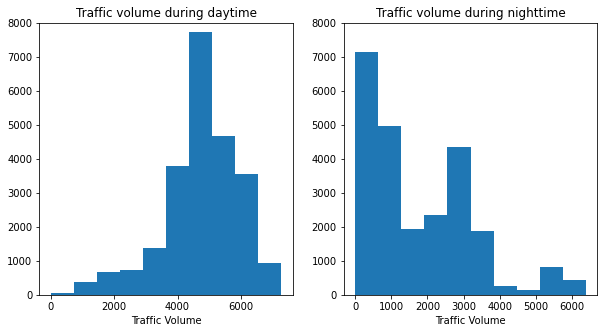

In [10]:
# Create Traffic Volume frequency for daytime and nighttime

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.hist(tr_day["traffic_volume"])
plt.title("Traffic volume during daytime")
plt.xlabel("Traffic Volume")
plt.ylim(0, 8000)

plt.subplot(1, 2, 2)
plt.hist(tr_night["traffic_volume"])
plt.title("Traffic volume during nighttime")
plt.xlabel("Traffic Volume")
plt.ylim(0, 8000)

plt.show()

In [11]:
print("Traffic Volume - Daytime:")
print(tr_day["traffic_volume"].describe())
print()
print("Traffic Volume - Nighttime:")
print(tr_night["traffic_volume"].describe())

Traffic Volume - Daytime:
count    23877.000000
mean      4762.047452
std       1174.546482
min          0.000000
25%       4252.000000
50%       4820.000000
75%       5559.000000
max       7280.000000
Name: traffic_volume, dtype: float64

Traffic Volume - Nighttime:
count    24327.000000
mean      1785.377441
std       1441.951197
min          0.000000
25%        530.000000
50%       1287.000000
75%       2819.000000
max       6386.000000
Name: traffic_volume, dtype: float64


Both graphs support our assumption that each peak is for daytime and nighttime traffic. The graphs show that higher traffic volume occurs more often in the daytime than in the nighttime.

Now we will explore the changes in traffic volume in each month.

### Traffic volume by month

In [12]:
# Add "month" column

traffic["month"] = traffic["date_time"].dt.month

# Update "tr_day" and "tr_night" dataframes

tr_day = traffic.loc[traffic["day_night"] == "day"]
tr_night = traffic.loc[traffic["day_night"] == "night"]

# Calculate average traffic volume by month

by_month_all = traffic.groupby("month").mean()
by_month_day = tr_day.groupby("month").mean()
by_month_night = tr_night.groupby("month").mean()

print("Average Traffic Volume by Month - Overall:")
print(by_month_all["traffic_volume"])
print()
print("Average Traffic Volume by Month - Daytime:")
print(by_month_day["traffic_volume"])
print()
print("Average Traffic Volume by Month - Nighttime:")
print(by_month_night["traffic_volume"])

Average Traffic Volume by Month - Overall:
month
1     3051.081378
2     3197.945547
3     3308.388611
4     3304.372388
5     3366.319432
6     3419.077413
7     3205.481752
8     3394.241891
9     3303.049334
10    3390.678376
11    3167.592784
12    3024.257943
Name: traffic_volume, dtype: float64

Average Traffic Volume by Month - Daytime:
month
1     4495.613727
2     4711.198394
3     4889.409560
4     4906.894305
5     4911.121609
6     4898.019566
7     4595.035744
8     4928.302035
9     4870.783145
10    4921.234922
11    4704.094319
12    4374.834566
Name: traffic_volume, dtype: float64

Average Traffic Volume by Month - Nighttime:
month
1     1616.610448
2     1716.961841
3     1817.272029
4     1786.116598
5     1829.852518
6     1932.272727
7     1838.349193
8     1897.564079
9     1818.959858
10    1852.168591
11    1680.311799
12    1622.508393
Name: traffic_volume, dtype: float64


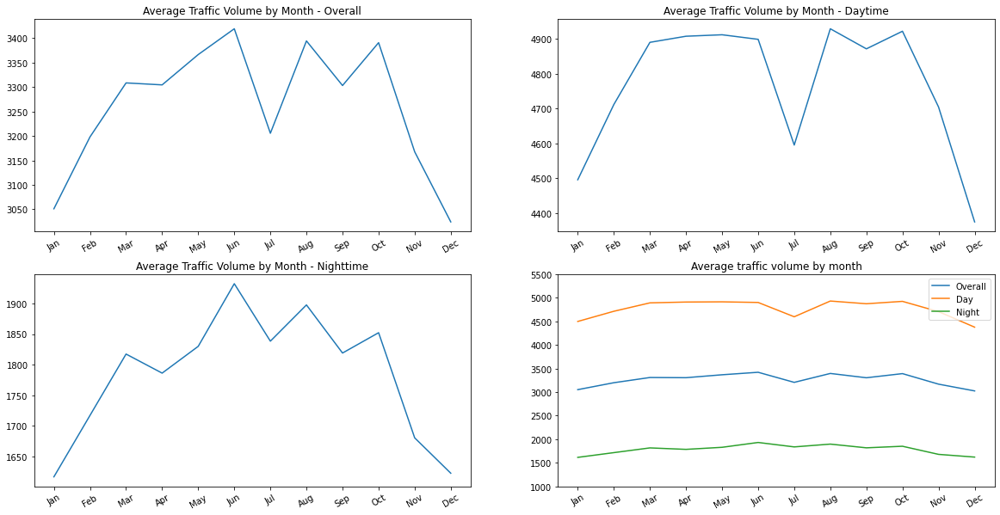

In [13]:
plt.figure(figsize=(20, 10))
month = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

plt.subplot(2, 2, 1)
plt.plot(by_month_all["traffic_volume"], label="Overall")
plt.title("Average Traffic Volume by Month - Overall")
plt.xticks(np.arange(1, 13, 1), month, rotation=30)

plt.subplot(2, 2, 2)
plt.plot(by_month_day["traffic_volume"], label="Day")
plt.title("Average Traffic Volume by Month - Daytime")
plt.xticks(np.arange(1, 13, 1), month, rotation=30)

plt.subplot(2, 2, 3)
plt.plot(by_month_night["traffic_volume"], label="Night")
plt.title("Average Traffic Volume by Month - Nighttime")
plt.xticks(np.arange(1, 13, 1), month, rotation=30)

plt.subplot(2, 2, 4)
plt.plot(by_month_all["traffic_volume"], label="Overall")
plt.plot(by_month_day["traffic_volume"], label="Day")
plt.plot(by_month_night["traffic_volume"], label="Night")
plt.title("Average traffic volume by month")
plt.xticks(np.arange(1, 13, 1), month, rotation=30)
plt.ylim(1000, 5500)

plt.legend()
plt.show()

From the graphs above, the average traffic volume in each month during daytime and nighttime share similar shape. The traffic volume are lower in winter months, at the lowest in December. The traffic volume are higher in Spring, Summer, and Autumn. However, there is a drop in July, which might be due to school breaks or holidays.

### Traffic volume by day of the week

In [14]:
# Add a column to identify a day of a week

traffic["day_of_week"] = traffic["date_time"].dt.dayofweek

# Update "tr_day" and "tr_night" dataframes

tr_day = traffic.loc[traffic["day_night"] == "day"]
tr_night = traffic.loc[traffic["day_night"] == "night"]

# Calculate average traffic volume by day of the week

by_dow_all = traffic.groupby("day_of_week").mean()
by_dow_day = tr_day.groupby("day_of_week").mean()
by_dow_night = tr_night.groupby("day_of_week").mean()

print("Average Traffic Volume by Day of Week - Overall:")
print(by_dow_all["traffic_volume"])
print()
print("Average Traffic Volume by Day of Week - Daytime:")
print(by_dow_day["traffic_volume"])
print()
print("Average Traffic Volume by Day of Week - Nighttime:")
print(by_dow_night["traffic_volume"])

Average Traffic Volume by Day of Week - Overall:
day_of_week
0    3309.387161
1    3488.555799
2    3583.196681
3    3637.899663
4    3656.358836
5    2773.638120
6    2368.588329
Name: traffic_volume, dtype: float64

Average Traffic Volume by Day of Week - Daytime:
day_of_week
0    4893.551286
1    5189.004782
2    5284.454282
3    5311.303730
4    5291.600829
5    3927.249558
6    3436.541789
Name: traffic_volume, dtype: float64

Average Traffic Volume by Day of Week - Nighttime:
day_of_week
0    1722.532692
1    1862.926571
2    1901.465710
3    1994.177959
4    2059.882336
5    1634.459412
6    1323.998273
Name: traffic_volume, dtype: float64


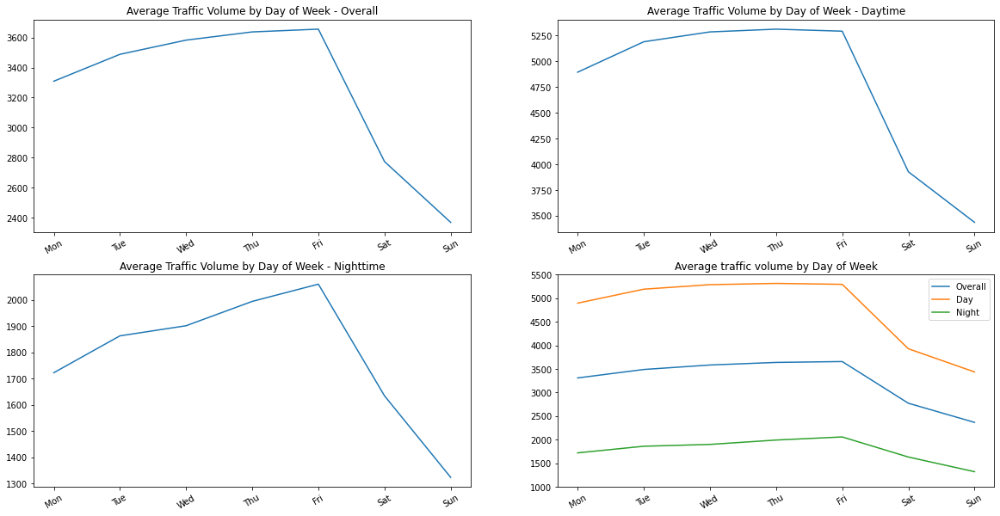

In [15]:
plt.figure(figsize=(20, 10))
dow = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]

plt.subplot(2, 2, 1)
plt.plot(by_dow_all["traffic_volume"], label="Overall")
plt.title("Average Traffic Volume by Day of Week - Overall")
plt.xticks(np.arange(0, 7, 1), dow, rotation=30)

plt.subplot(2, 2, 2)
plt.plot(by_dow_day["traffic_volume"], label="Day")
plt.title("Average Traffic Volume by Day of Week - Daytime")
plt.xticks(np.arange(0, 7, 1), dow, rotation=30)

plt.subplot(2, 2, 3)
plt.plot(by_dow_night["traffic_volume"], label="Night")
plt.title("Average Traffic Volume by Day of Week - Nighttime")
plt.xticks(np.arange(0, 7, 1), dow, rotation=30)

plt.subplot(2, 2, 4)
plt.plot(by_dow_all["traffic_volume"], label="Overall")
plt.plot(by_dow_day["traffic_volume"], label="Day")
plt.plot(by_dow_night["traffic_volume"], label="Night")
plt.title("Average traffic volume by Day of Week")
plt.xticks(np.arange(0, 7, 1), dow, rotation=30)
plt.ylim(1000, 5500)

plt.legend()
plt.show()

Again, the 3 graphs share similar shape. The traffic during Monday to Friday are higher than those during the weekends.

### Traffic volume by hour

In [16]:
# Add a column to identify working day and weekend

traffic["weekend"] = traffic["day_of_week"] >= 5
traffic.loc[traffic["weekend"] == True, "weekend"] = "weekend"
traffic.loc[traffic["weekend"] == False, "weekend"] = "weekday"

# Create new dataframe for weekday and weekend

all_wd = traffic.loc[traffic["weekend"] == "weekday"]
all_we = traffic.loc[traffic["weekend"] == "weekend"]

# Calculate average traffic volume at each hour by types of day

by_hour_weekday = all_wd.groupby("hour").mean()
by_hour_weekend = all_we.groupby("hour").mean()

print("Average Traffic Volume at each hour during weekdays:")
print(by_hour_weekday["traffic_volume"])
print()
print("Average Traffic Volume at each hour during weekend:")
print(by_hour_weekend["traffic_volume"])

Average Traffic Volume at each hour during weekdays:
hour
0      651.528971
1      396.913043
2      301.982818
3      362.289835
4      832.661096
5     2701.296703
6     5365.983210
7     6030.413559
8     5503.497970
9     4895.269257
10    4378.419118
11    4633.419470
12    4855.382143
13    4859.180473
14    5152.995778
15    5592.897768
16    6189.473647
17    5784.827133
18    4434.209431
19    3298.340426
20    2842.433004
21    2673.042807
22    2125.913104
23    1379.549728
Name: traffic_volume, dtype: float64

Average Traffic Volume at each hour during weekend:
hour
0     1306.414035
1      805.128333
2      611.171986
3      393.611599
4      375.420168
5      639.237232
6     1089.100334
7     1589.365894
8     2338.578073
9     3111.623917
10    3686.632302
11    4044.154955
12    4372.482883
13    4362.296564
14    4358.543796
15    4342.456881
16    4339.693805
17    4151.919929
18    3811.792279
19    3220.234120
20    2815.039216
21    2658.445242
22    2384.368607
2

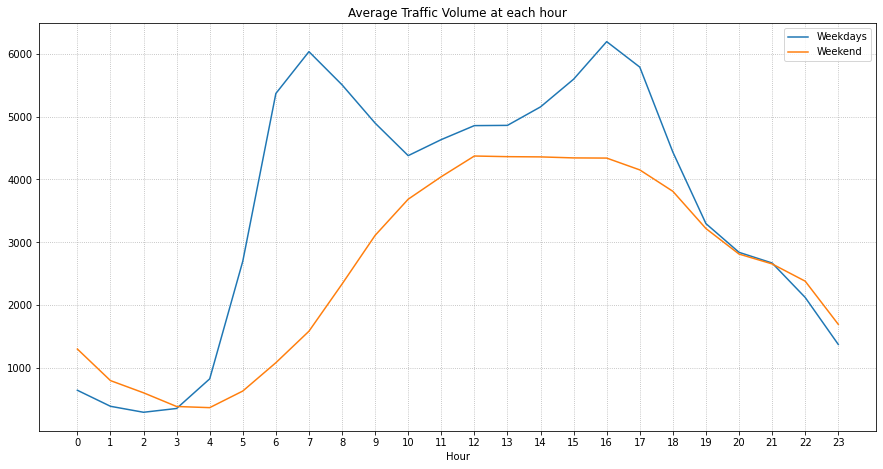

In [17]:
plt.figure(figsize=(15, 7.5))
plt.plot(by_hour_weekday["traffic_volume"], label="Weekdays")
plt.plot(by_hour_weekend["traffic_volume"], label="Weekend")
plt.title("Average Traffic Volume at each hour")
plt.xticks(np.arange(0, 24, 1))
plt.xlabel("Hour")
plt.legend()
plt.grid(linestyle=":")
plt.show()

During weekdays, the traffic starts increasing since 3am. The heavy traffic seems to start slightly before 6am and reachs its peak at 7am. The morning rush hours stop at 9 am but the overall traffic volume remains high. The afternoon rush hours start at 2pm and reach the peak at 4pm. This pattern is aligned with the working hours and school hours. However, the slope in the afternoon is not as steep as in the morning. We could assume that people do not rush going home as they rush to work or school.

During weekend, the traffic starts at 4am but the slope is much less steep than the weekdays line. The traffic reaches its peak at 12pm and lasts 4-5 hours.

### Identify other possible heavy traffic volume indicators
#### Numerical columns

In [18]:
traffic.corr()["traffic_volume"]

temp              0.130299
rain_1h           0.004714
snow_1h           0.000733
clouds_all        0.067054
traffic_volume    1.000000
hour              0.352401
month            -0.002533
day_of_week      -0.149544
Name: traffic_volume, dtype: float64

We see a strong correlation between traffic volume and hour, as we already analyzed this relationship. We will look at the next strong correlation, which is temperature. The correlation between traffic and temperature, although at 0.13, is relatively stronger than other weather indicators. This suggests that the temperature could affect the traffic volume.

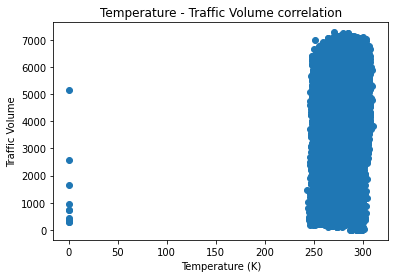

In [19]:
plt.scatter(traffic["temp"], traffic["traffic_volume"])
plt.xlabel("Temperature (K)")
plt.ylabel("Traffic Volume")
plt.title("Temperature - Traffic Volume correlation")
plt.show()

We know about these outliers before. There is no need to remove these outliers as the main part doesn't show any strong correlation. However, the outliers will be removed so we can see the correlation scatter plot better.

In [20]:
print(f"Before: {traffic.shape[0]}")
traffic = traffic[traffic["temp"] != 0]
print(f"After: {traffic.shape[0]}")

Before: 48204
After: 48194


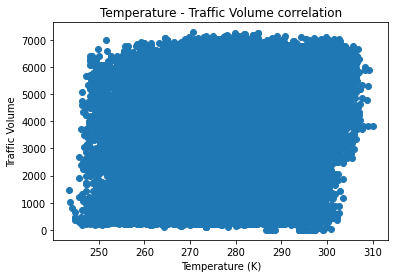

In [21]:
plt.scatter(traffic["temp"], traffic["traffic_volume"])
plt.xlabel("Temperature (K)")
plt.ylabel("Traffic Volume")
plt.title("Temperature - Traffic Volume correlation")
plt.show()

Since there is no strong correlation between traffic volume and other numerical weather conditions, we will try to find if the text weather columns could be used as a heavy traffic indicator.

#### Text columns

In [22]:
# Check "weather_main" column

by_w_main = traffic.groupby("weather_main").mean()

print("Average Traffic Volume by weather types:")
print(by_w_main["traffic_volume"])

Average Traffic Volume by weather types:
weather_main
Clear           3057.207458
Clouds          3618.449749
Drizzle         3290.727073
Fog             2703.720395
Haze            3502.101471
Mist            2932.956639
Rain            3317.905501
Smoke           3237.650000
Snow            3016.844228
Squall          2061.750000
Thunderstorm    3001.620890
Name: traffic_volume, dtype: float64


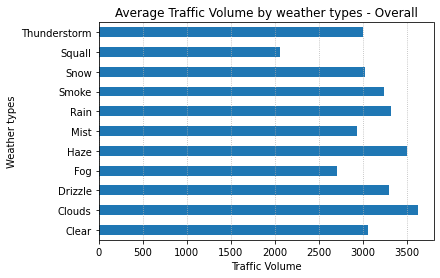

In [23]:
by_w_main["traffic_volume"].plot.barh()
plt.title("Average Traffic Volume by weather types - Overall")
plt.ylabel("Weather types")
plt.xlabel("Traffic Volume")
plt.grid(axis="x", linestyle=":")
plt.show()

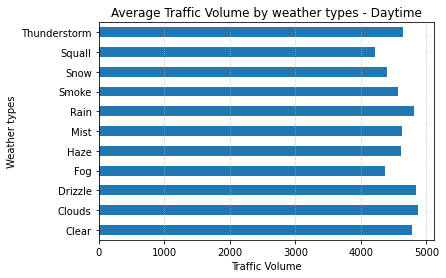

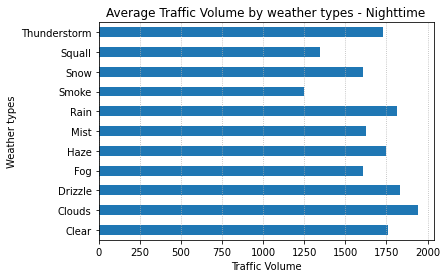

In [24]:
day_w_main = tr_day.groupby("weather_main").mean()

day_w_main["traffic_volume"].plot.barh()
plt.title("Average Traffic Volume by weather types - Daytime")
plt.ylabel("Weather types")
plt.xlabel("Traffic Volume")
plt.grid(axis="x", linestyle=":")
plt.show()

night_w_main = tr_night.groupby("weather_main").mean()

night_w_main["traffic_volume"].plot.barh()
plt.title("Average Traffic Volume by weather types - Nighttime")
plt.ylabel("Weather types")
plt.xlabel("Traffic Volume")
plt.grid(axis="x", linestyle=":")
plt.show()

This `weather_main` column doesn't show a strong indicator of which weather type affects the traffic volume. We will therefore continue to check `weather_description` column. 

In [25]:
# Clean data in "weather_description" column

traffic.loc[traffic["weather_description"] == "Sky is Clear", "weather_description"] = "sky is clear"
traffic.loc[traffic["weather_description"] == "SQUALLS", "weather_description"] = "squalls"

# Update "tr_day" and "tr_night" dataframes

tr_day = traffic.loc[traffic["day_night"] == "day"]
tr_night = traffic.loc[traffic["day_night"] == "night"]

In [26]:
by_w_description = traffic.groupby("weather_description").mean()

print("Average Traffic Volume by weather types:")
print(by_w_description["traffic_volume"])

Average Traffic Volume by weather types:
weather_description
broken clouds                          3661.142092
drizzle                                3094.858679
few clouds                             3691.453476
fog                                    2703.720395
freezing rain                          4314.000000
haze                                   3502.101471
heavy intensity drizzle                3371.109375
heavy intensity rain                   3140.072805
heavy snow                             3031.472403
light intensity drizzle                3400.567273
light intensity shower rain            4140.307692
light rain                             3349.257117
light rain and snow                    3961.166667
light shower snow                      4618.636364
light snow                             3042.770298
mist                                   2932.956639
moderate rain                          3202.603966
overcast clouds                        3375.963590
proximity shower rain

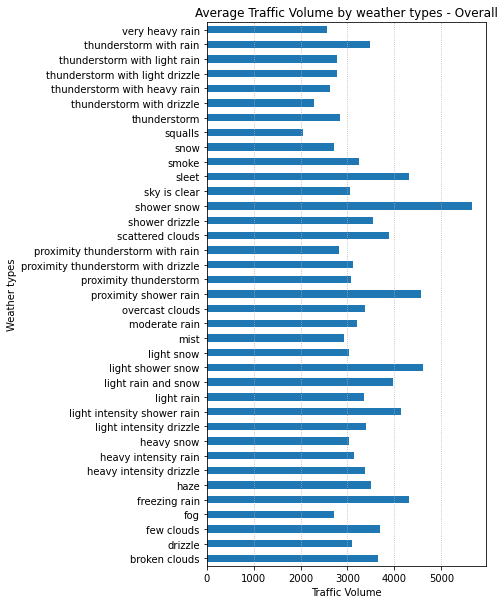

In [27]:
by_w_description["traffic_volume"].plot.barh(figsize=(5,10))
plt.title("Average Traffic Volume by weather types - Overall")
plt.ylabel("Weather types")
plt.xlabel("Traffic Volume")
plt.grid(axis="x", linestyle=":")
plt.show()

Overall, "shower snow" shows the highest traffic volume, at over 5,000 cars in an hour. The other weather types that could lead to congestion are sleet, proximity shower rain, light shower snow, light intensity shower rain, and freezing rain.

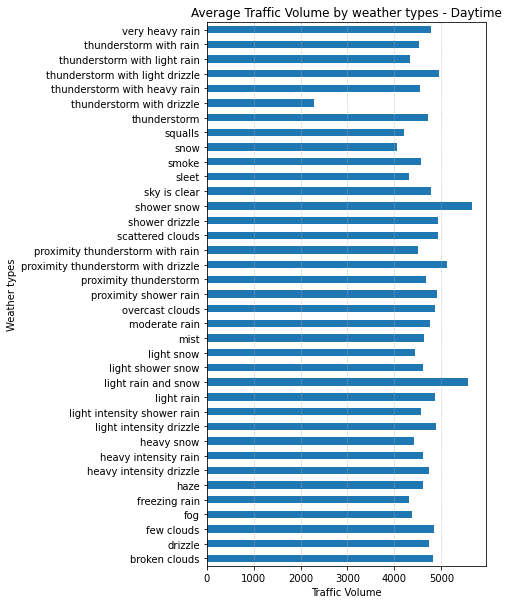

In [28]:
day_w_description = tr_day.groupby("weather_description").mean()

day_w_description["traffic_volume"].plot.barh(figsize=(5, 10))
plt.title("Average Traffic Volume by weather types - Daytime")
plt.ylabel("Weather types")
plt.xlabel("Traffic Volume")
plt.grid(axis="x", linestyle=":")
plt.show()


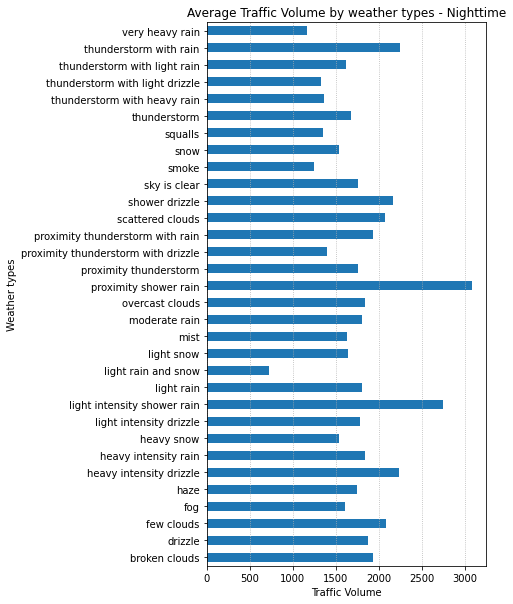

In [31]:
night_w_description = tr_night.groupby("weather_description").mean()

night_w_description["traffic_volume"].plot.barh(figsize=(5, 10))
plt.title("Average Traffic Volume by weather types - Nighttime")
plt.ylabel("Weather types")
plt.xlabel("Traffic Volume")
plt.grid(axis="x", linestyle=":")
plt.show()

Now that we focus on daytime and nighttime separately, we can see that the traffic volume is high in almost every weather condition in the daytime. The highest traffic volume is caused by "shower snow" and "light rain and snow". On the other hand, when there is a "thunderstorm with drizzle", the traffic volume is much lower.

In the nighttime, the traffic is highest when there is a "proximity shower rain" and lowest when it rains and snows lightly.

## Conclusion
From the analysis, we can conclude that:

* The traffic volume in the daytime is higher than in the nighttime.
* The traffic volume is lower in winter months, and is higher in the warmer months.
* The traffic volume during weekdays are busier than during weekend.
* The morning rush hour during weekdays is from 6am to 9am.
* The weather types that could lead to congestion in the daytime are "shower snow"and "light rain and snow".
* The weather type that could lead to congestion in the nighttime is "proximity shower rain".